In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
import os

sys.path.append(os.path.abspath("/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project"))

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from Scripts import Data_v2
from Scripts import Data_analysis_func
from Scripts import Model_checks
import seaborn as sns
from scipy.stats import multivariate_normal
from sklearn.linear_model import LinearRegression
from Scripts import Outlier_detection_v2
from Scripts import Genes_self_similarity_v2
from matplotlib_venn import venn2, venn2_circles
from Scripts import Feature_engineering
from Scripts import Clusters
from tqdm import tqdm

## Checking that the model is correct

In [4]:
data = Data_v2.get_format_data_without_na()
data_norm = Data_v2.get_norm_data()

/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Data_v2.py:185: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data_copy.at[index, column_name] -= wt_mean_y2[i - 1]
/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Data_v2.py:193: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data_copy.at[index, column_name] -= wt_mean_ynpq[i - 1]


In [5]:
data = pd.read_csv('/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Data/raw_data_phase_1_07_26_2024.csv')

In [7]:
data_norm = pd.read_csv('/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Data/database_phase_1_after_preprocessing_07_23_2024.csv')

In [10]:
data = data[data['plate'] != 24]

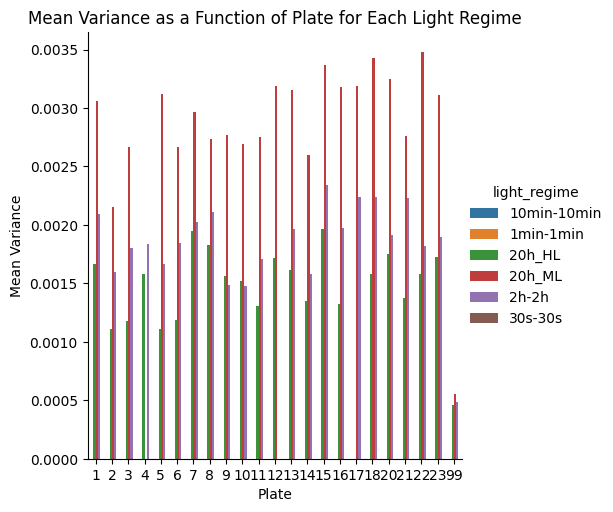

,mean_variance,plate,light_regime
0,NaN,1,10min-10min
1,NaN,1,1min-1min
2,0.001662,1,20h_HL
3,0.003060,1,20h_ML
4,0.002093,1,2h-2h
...,...,...,...
126,NaN,99,1min-1min
127,0.000460,99,20h_HL
128,0.000553,99,20h_ML
129,0.000482,99,2h-2h


In [11]:
Data_analysis_func.variance_per_plate_and_light_regime_y2(data)

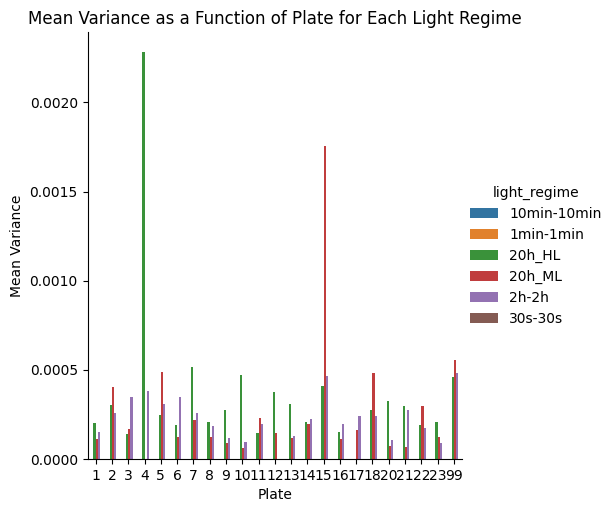

,mean_variance,plate,light_regime
0,NaN,1,10min-10min
1,NaN,1,1min-1min
2,0.000198,1,20h_HL
3,0.000110,1,20h_ML
4,0.000148,1,2h-2h
...,...,...,...
126,NaN,99,1min-1min
127,0.000460,99,20h_HL
128,0.000553,99,20h_ML
129,0.000482,99,2h-2h


In [12]:
Data_analysis_func.variance_per_plate_and_light_regime_y2(data[data['mutant_ID'] == 'WT'])

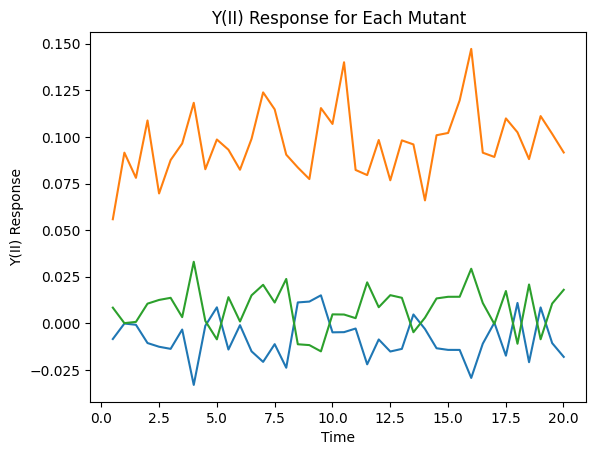

In [13]:
Data_analysis_func.plot_y2(data_norm[(data_norm['plate'] == 4) & (data_norm['mutant_ID'] == 'WT') & (data_norm['light_regime'] == '20h_HL')])

In [15]:
data['light_regime'].unique()

array(['1min-1min', '10min-10min', '20h_HL', '20h_ML', '2h-2h', '30s-30s'],
      dtype=object)

In [23]:
data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['light_regime'] == '10min-10min')]['plate'].unique()   

array([99.,  5.,  7.,  9., 10., 11., 13., 14., 15., 16.,  8., 18., 17.,
       21., 22., 23., 20.,  2.,  3., 12., 24.,  1.])

In [74]:
data = pd.read_parquet('/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Data/database_2024-08-03.parquet')

In [89]:
data[(data['plate'] == '4') & (data['mutant_ID'] == 'WT')]

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,...,measurement_time_173,measurement_time_174,measurement_time_175,measurement_time_176,measurement_time_177,well_id,mutant_ID,feature,mutated_genes,num_mutations
4271,4,M2,2023-10-31,1min-1min,18.158632,25.964426,164,2,11,0.614210,...,NaN,NaN,NaN,NaN,NaN,C12,WT,None,None,0.0
4526,4,M2,2023-10-31,1min-1min,18.158632,25.964426,164,13,2,0.640608,...,NaN,NaN,NaN,NaN,NaN,N03,WT,None,None,0.0
4545,4,M2,2023-10-31,1min-1min,18.158632,25.964426,164,13,21,0.611693,...,NaN,NaN,NaN,NaN,NaN,N22,WT,None,None,0.0
4654,4,M3,2023-11-01,20h_HL,21.840956,27.206502,84,2,11,0.623704,...,NaN,NaN,NaN,NaN,NaN,C12,WT,None,None,0.0
4909,4,M3,2023-11-01,20h_HL,21.840956,27.206502,84,13,2,0.648696,...,NaN,NaN,NaN,NaN,NaN,N03,WT,None,None,0.0
4928,4,M3,2023-11-01,20h_HL,21.840956,27.206502,84,13,21,0.620400,...,NaN,NaN,NaN,NaN,NaN,N22,WT,None,None,0.0
5037,4,M5,2023-11-03,2h-2h,18.945512,27.818119,84,2,11,0.624693,...,NaN,NaN,NaN,NaN,NaN,C12,WT,None,None,0.0
5292,4,M5,2023-11-03,2h-2h,18.945512,27.818119,84,13,2,0.646288,...,NaN,NaN,NaN,NaN,NaN,N03,WT,None,None,0.0
5311,4,M5,2023-11-03,2h-2h,18.945512,27.818119,84,13,21,0.630942,...,NaN,NaN,NaN,NaN,NaN,N22,WT,None,None,0.0
45252,4,M6,2024-04-15,30s-30s,15.292417,27.973293,164,2,11,0.639382,...,NaN,NaN,NaN,NaN,NaN,C12,WT,None,None,0.0


In [90]:
data_norm[(data_norm['plate'] == 4) & (data_norm['mutant_ID'] == 'WT')]

,Unnamed: 0,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,...,mean_ynpq,GO,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,slope_y2,slope_ynpq
4427,4427,4.0,M2,2023-10-31,1min-1min,18.158632,25.964426,164,2,11,...,0.010607,[],825,0.622716,0.590196,0.009595,ok,ok,0.000122,0.000155
4679,4679,4.0,M2,2023-10-31,1min-1min,18.158632,25.964426,164,13,2,...,-0.022404,[],825,0.622716,0.590196,0.009595,ok,ok,0.000361,-0.001054
4692,4692,4.0,M2,2023-10-31,1min-1min,18.158632,25.964426,164,13,21,...,0.011798,[],825,0.622716,0.590196,0.009595,ok,ok,-0.000483,0.000899
4790,4790,4.0,M3,2023-11-01,20h_HL,21.840956,27.206502,84,2,11,...,0.007008,[],445,0.632069,0.520690,0.069136,ok,ok,-0.000120,0.000118
5042,5042,4.0,M3,2023-11-01,20h_HL,21.840956,27.206502,84,13,2,...,-0.121715,[],445,0.632069,0.520690,0.069136,weird,weird,0.000814,-0.003188
5055,5055,4.0,M3,2023-11-01,20h_HL,21.840956,27.206502,84,13,21,...,-0.007008,[],445,0.632069,0.520690,0.069136,ok,ok,0.000120,-0.000118
5154,5154,4.0,M5,2023-11-03,2h-2h,18.945512,27.818119,84,2,11,...,0.008178,[],445,0.637149,0.608953,-0.079200,ok,ok,-0.000210,0.000341
5406,5406,4.0,M5,2023-11-03,2h-2h,18.945512,27.818119,84,13,2,...,-0.027575,[],445,0.637149,0.608953,-0.079200,ok,ok,-0.000239,-0.000393
5420,5420,4.0,M5,2023-11-03,2h-2h,18.945512,27.818119,84,13,21,...,0.019397,[],445,0.637149,0.608953,-0.079200,ok,ok,0.000449,0.000051
47684,47684,4.0,M6,2024-04-15,30s-30s,15.292417,27.973293,164,2,11,...,0.003675,[],447,0.642131,0.610475,-0.005384,ok,ok,0.000150,0.000133


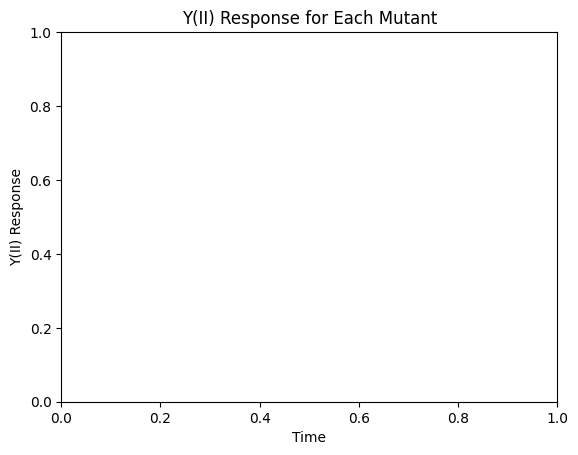

In [66]:
Data_analysis_func.plot_y2(data[(data['plate'] == 4) & (data['mutant_ID'] == 'WT') & (data['light_regime'] == '10min-10min')])

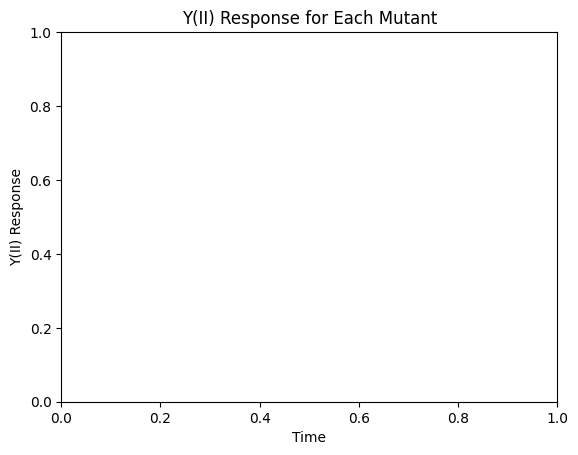

In [22]:
Data_analysis_func.plot_y2(data_norm[(data_norm['plate'] == 4) & (data_norm['mutant_ID'] == 'WT') & (data_norm['light_regime'] == '10min-10min')])

In [24]:
data_WT_99 = data[(data['mutant_ID'] == 'WT') & (data['plate'] == 99)]

In [25]:
# data_ML_WT_99 = data_WT_99[data_WT_99['light_regime'] == '20h_ML']
data_norm_ML_WT_99 = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['plate'] == 99) & (data_norm['light_regime'] == '20h_ML')]
data_norm_ML_WT = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['light_regime'] == '20h_ML')]

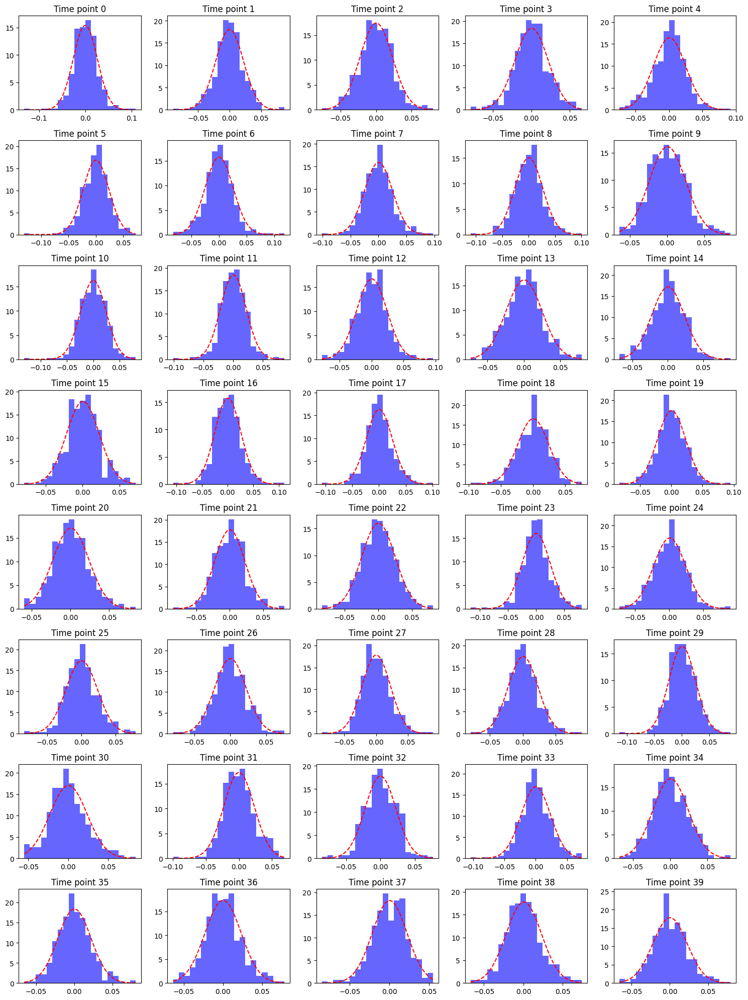

In [26]:
Model_checks.plot_y2_normalized_distribution(data_norm_ML_WT_99)

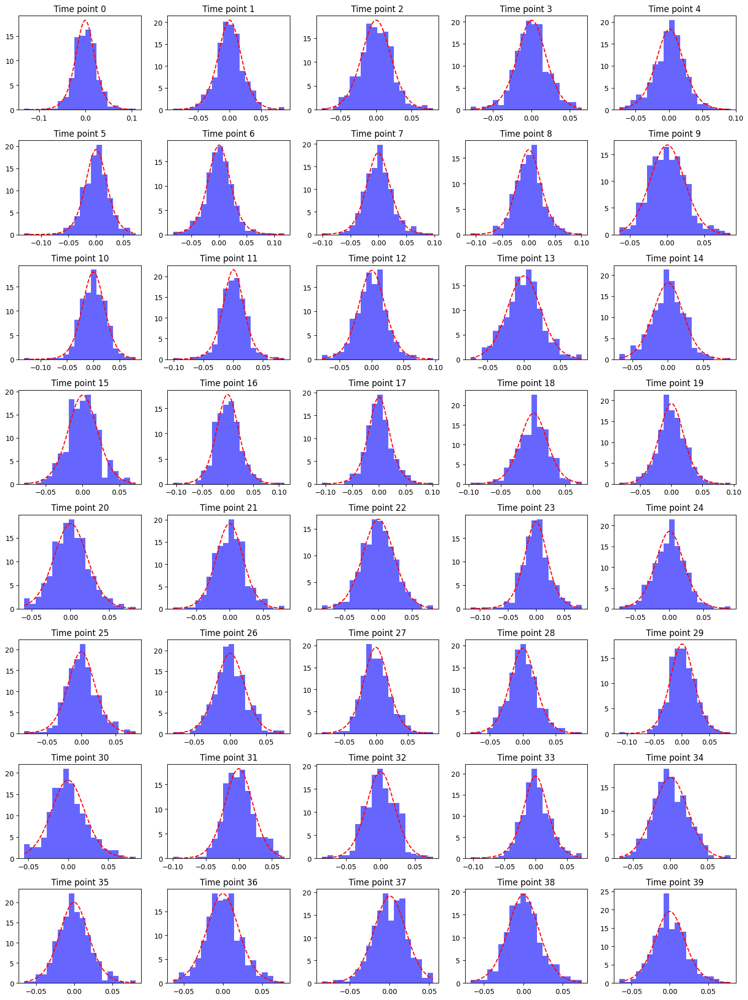

In [27]:
Model_checks.plot_y2_student_distribution(data_norm_ML_WT_99)

In [28]:
norm_test = Model_checks.normal_test(data_norm_ML_WT_99)

In [92]:
norm_test.to_csv('/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Data/normal_test_99.csv')

In [30]:
norm_test.T['p-value'].mean()

0.5489247823281739

In [31]:
student_test = Model_checks.student_test(data_norm_ML_WT_99)

In [32]:
student_test

,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,...,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40
statistic,0.048287,0.020405,0.028300,0.026633,0.045905,0.026783,0.020596,0.021945,0.030638,0.032529,...,0.034009,0.034756,0.032776,0.034871,0.039535,0.031853,0.029657,0.032417,0.023657,0.034054
p-value,0.323288,0.996359,0.910205,0.941973,0.383422,0.939418,0.995871,0.990881,0.853718,0.799902,...,0.754208,0.730325,0.792461,0.726608,0.573587,0.819843,0.878964,0.803267,0.979486,0.752760


In [33]:
student_test.T['p-value'].mean()

0.8303763898666755

In [35]:
indep_test = Model_checks.independence_test(data_norm_ML_WT_99)

In [36]:
indep_test

,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,...,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40
y2_1,NaN,0.501464,0.559637,0.483082,0.409218,0.44188,0.525786,0.531986,0.432521,0.500833,...,0.486652,0.520863,0.426159,0.499267,0.441751,0.458298,0.483224,0.464533,0.382303,0.54619
y2_2,0.501464,NaN,0.49474,0.444277,0.46759,0.455192,0.498874,0.436181,0.50664,0.432042,...,0.425528,0.505427,0.487517,0.448104,0.51121,0.446999,0.392592,0.478496,0.408514,0.44505
y2_3,0.559637,0.49474,NaN,0.421069,0.482559,0.432259,0.466596,0.529474,0.493528,0.433444,...,0.442952,0.415247,0.448562,0.415442,0.40237,0.480693,0.490307,0.461922,0.437041,0.492964
y2_4,0.483082,0.444277,0.421069,NaN,0.437274,0.448008,0.468069,0.401847,0.385335,0.474635,...,0.374936,0.437922,0.433774,0.374798,0.457211,0.350847,0.409817,0.39777,0.390341,0.401618
y2_5,0.409218,0.46759,0.482559,0.437274,NaN,0.395577,0.448648,0.471333,0.470779,0.440149,...,0.407423,0.413774,0.358525,0.314708,0.422953,0.397593,0.414458,0.437348,0.432836,0.437356
y2_6,0.44188,0.455192,0.432259,0.448008,0.395577,NaN,0.525024,0.464224,0.469579,0.452681,...,0.514945,0.470874,0.433181,0.466236,0.435984,0.408138,0.426986,0.490426,0.347009,0.459163
y2_7,0.525786,0.498874,0.466596,0.468069,0.448648,0.525024,NaN,0.509545,0.501106,0.505378,...,0.456208,0.52828,0.465413,0.437973,0.496725,0.48551,0.438349,0.468798,0.433305,0.436959
y2_8,0.531986,0.436181,0.529474,0.401847,0.471333,0.464224,0.509545,NaN,0.406308,0.456608,...,0.436386,0.451844,0.412126,0.434819,0.406683,0.481427,0.427182,0.445796,0.412196,0.512315
y2_9,0.432521,0.50664,0.493528,0.385335,0.470779,0.469579,0.501106,0.406308,NaN,0.48703,...,0.467854,0.51322,0.432618,0.398452,0.49707,0.484581,0.53622,0.536955,0.441054,0.508808
y2_10,0.500833,0.432042,0.433444,0.474635,0.440149,0.452681,0.505378,0.456608,0.48703,NaN,...,0.458856,0.531868,0.427561,0.439892,0.4589,0.390769,0.428617,0.495041,0.478697,0.499315


In [37]:
Model_checks.same_variance_test(data_norm_ML_WT_99)

Levene test statistic: 1.5391903029521399
P-value: 0.016982001775560755
Are the variances equal? No


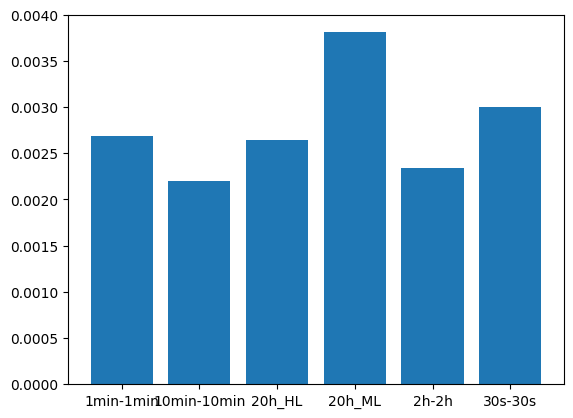

In [96]:
Model_checks.plot_mean_var_per_light_regime(data_norm)
plt.title('Mean and variance per light regime')

In [43]:
data_norm_WT = data_norm[data_norm['mutant_ID'] == 'WT']

In [40]:
data_WT = data[data['mutant_ID'] == 'WT']

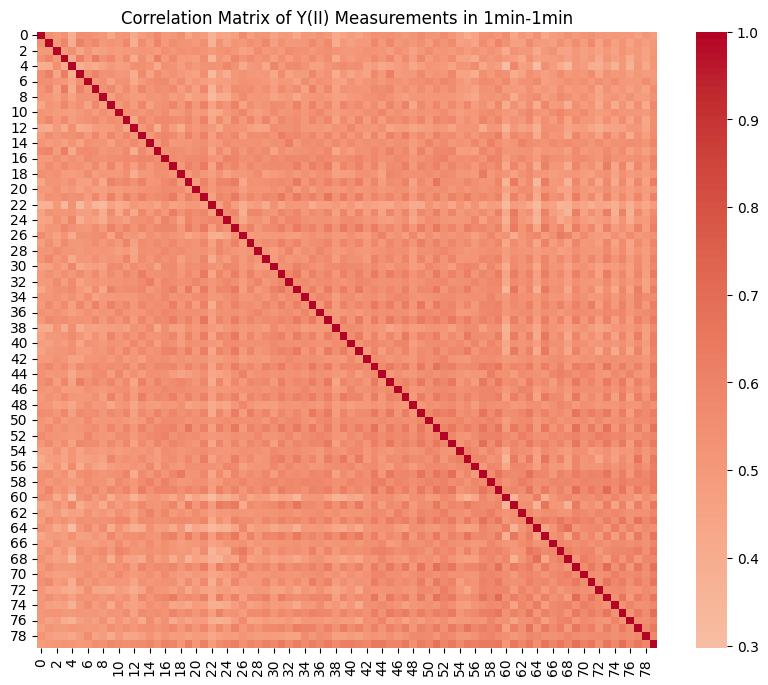

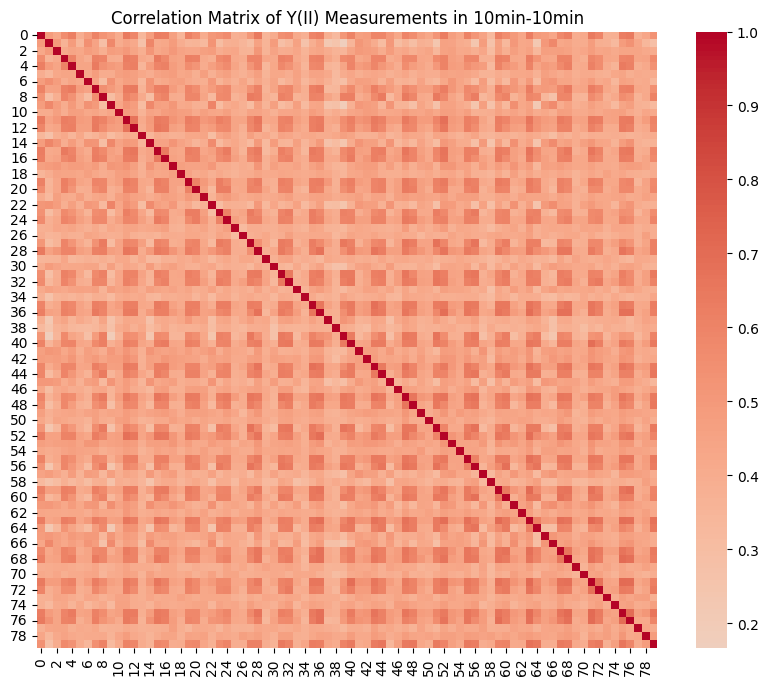

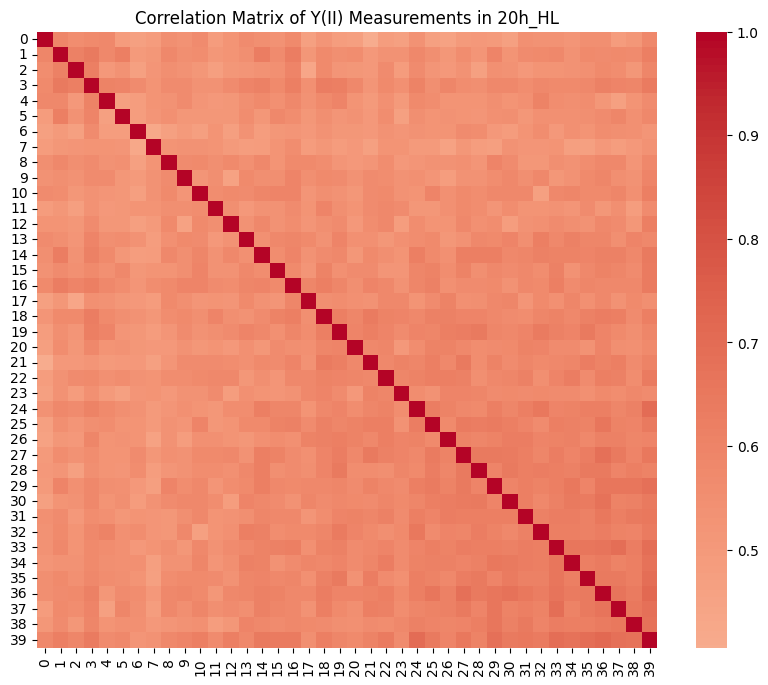

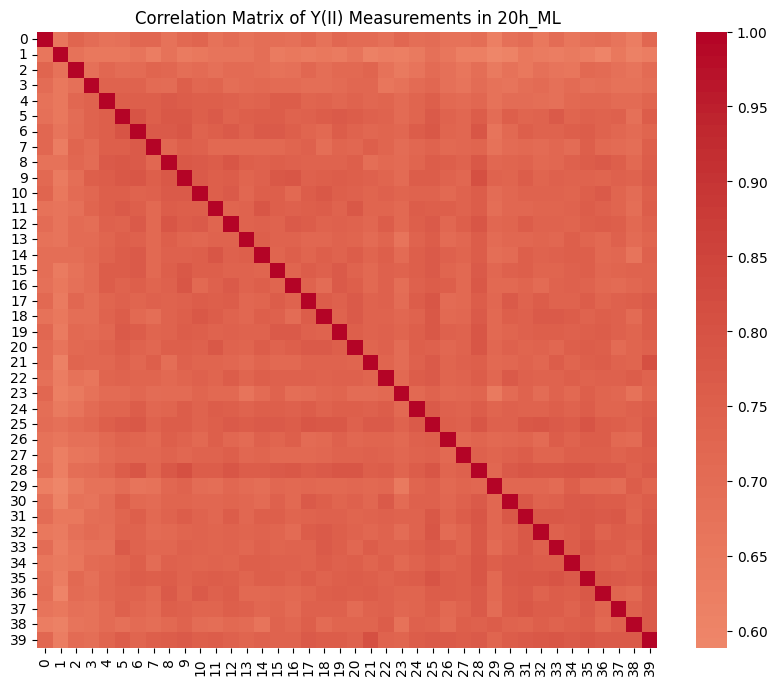

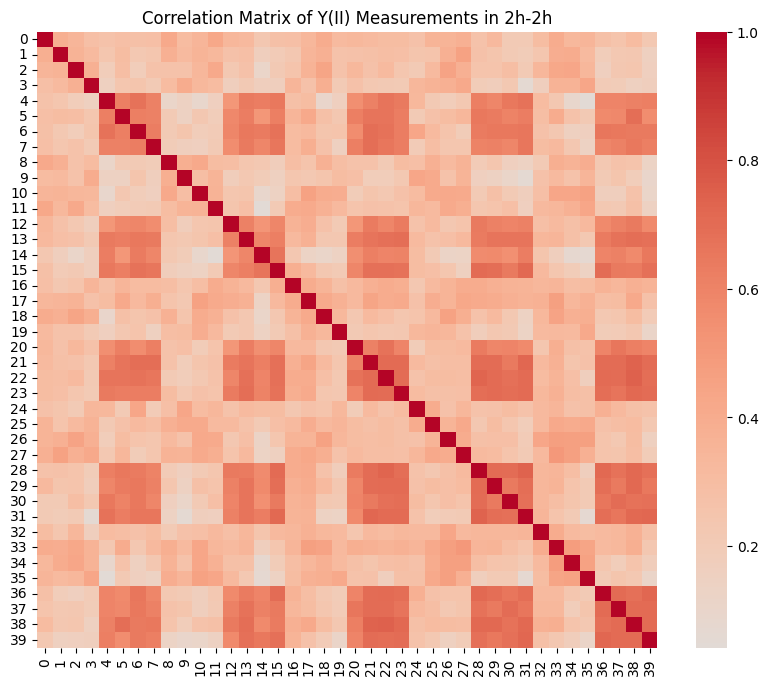

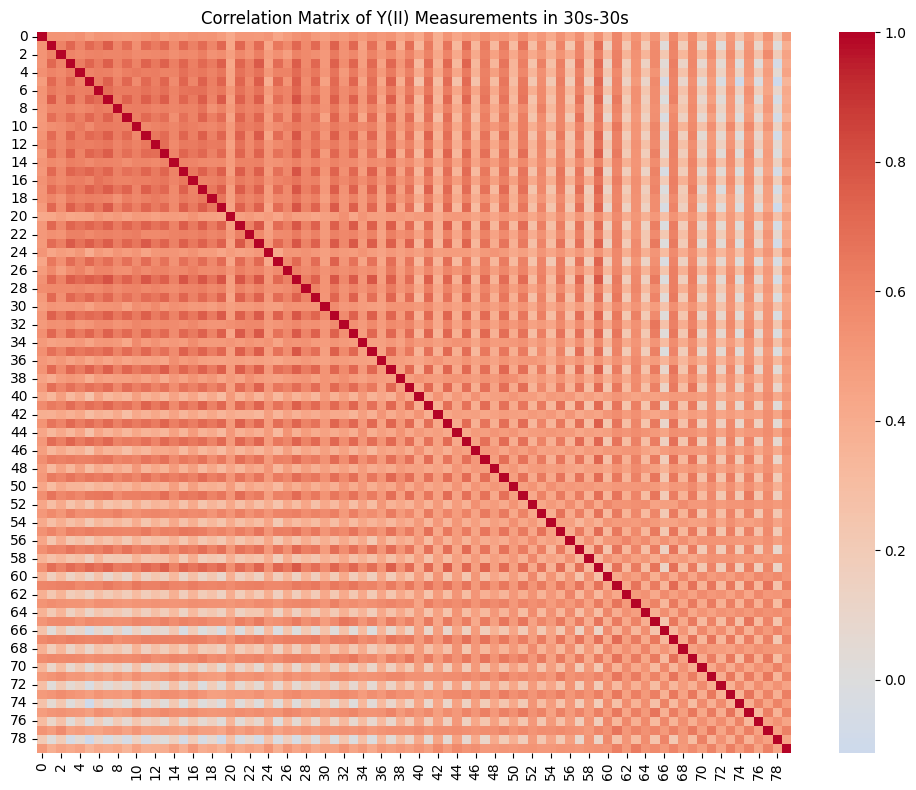

In [41]:
Model_checks.plot_corr_per_light_regime(data_WT)

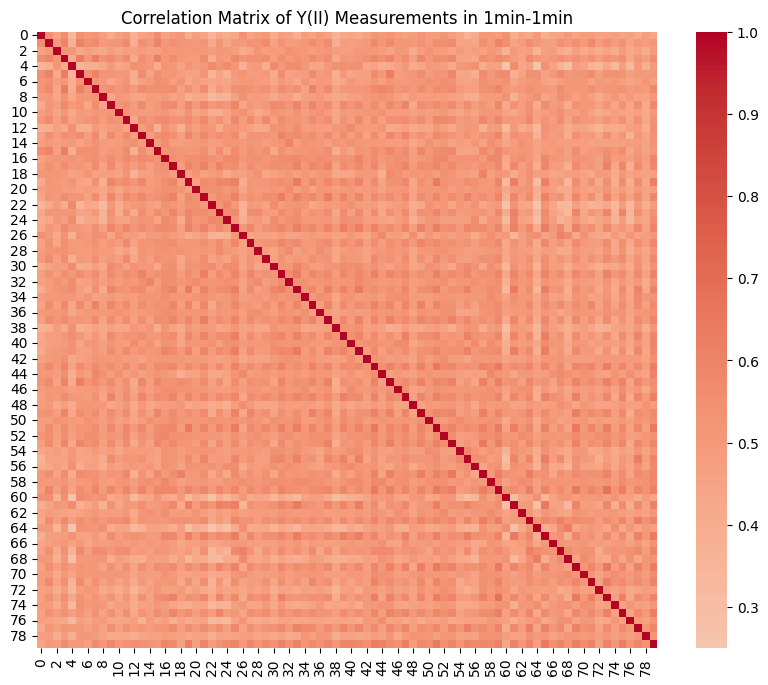

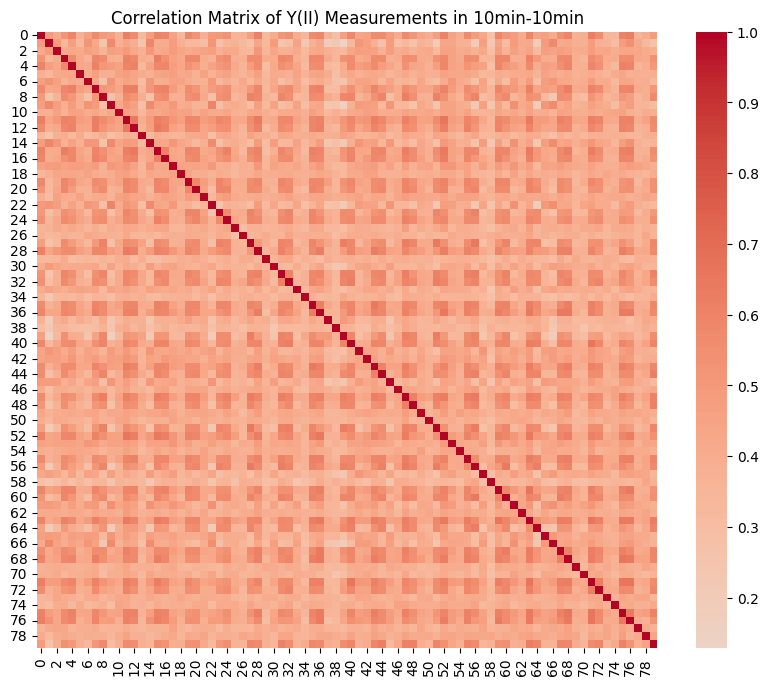

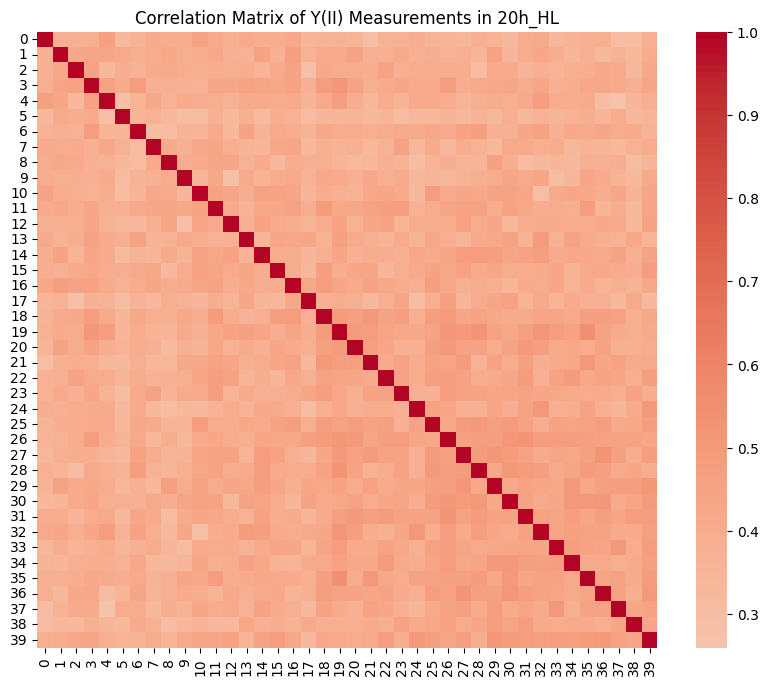

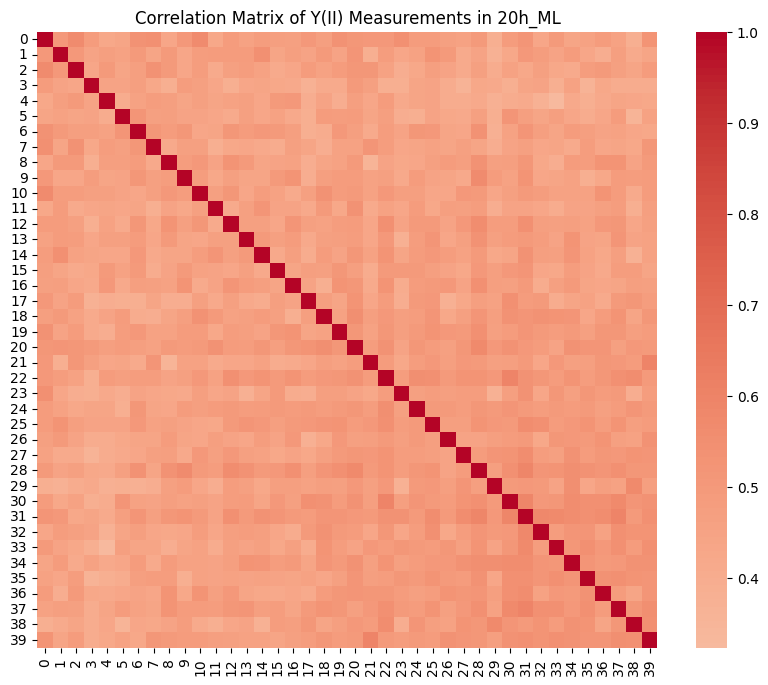

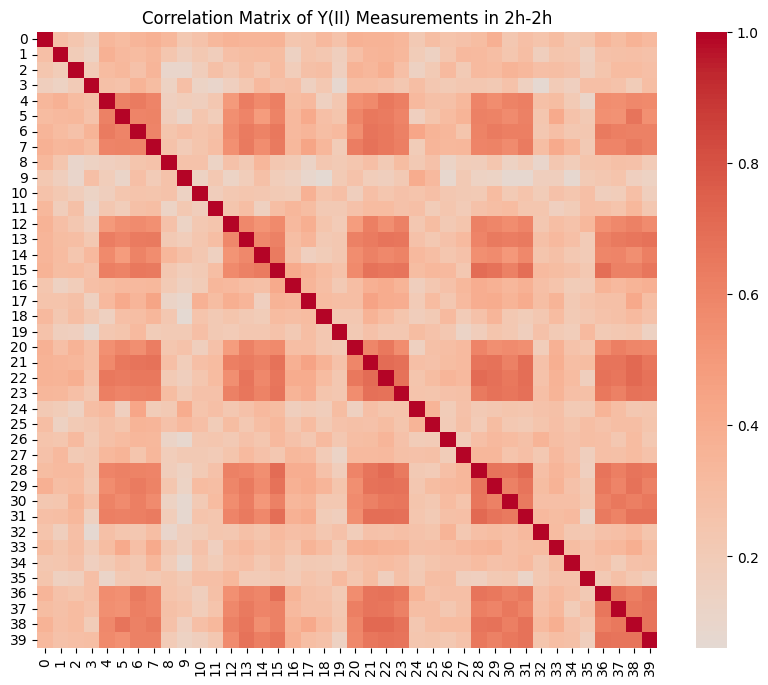

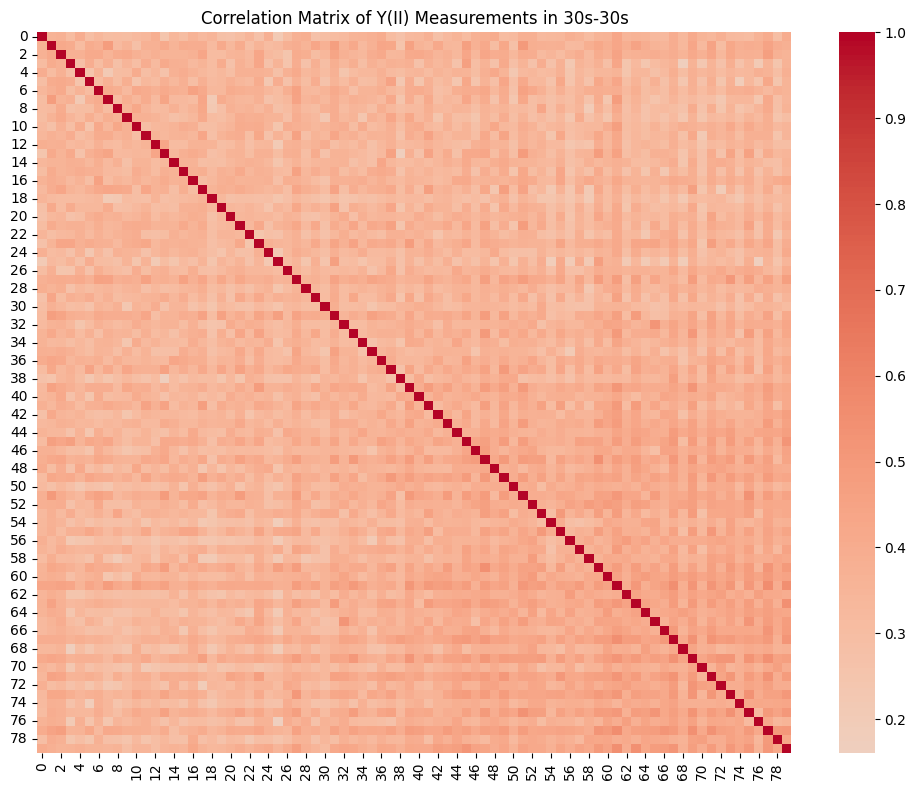

In [44]:
Model_checks.plot_corr_per_light_regime(data_norm_WT)

In [26]:
data_norm_ML_WT_99 = data_norm_ML[(data_norm_ML['mutant_ID'] == 'WT') & (data_norm_ML['plate'] == 99)]

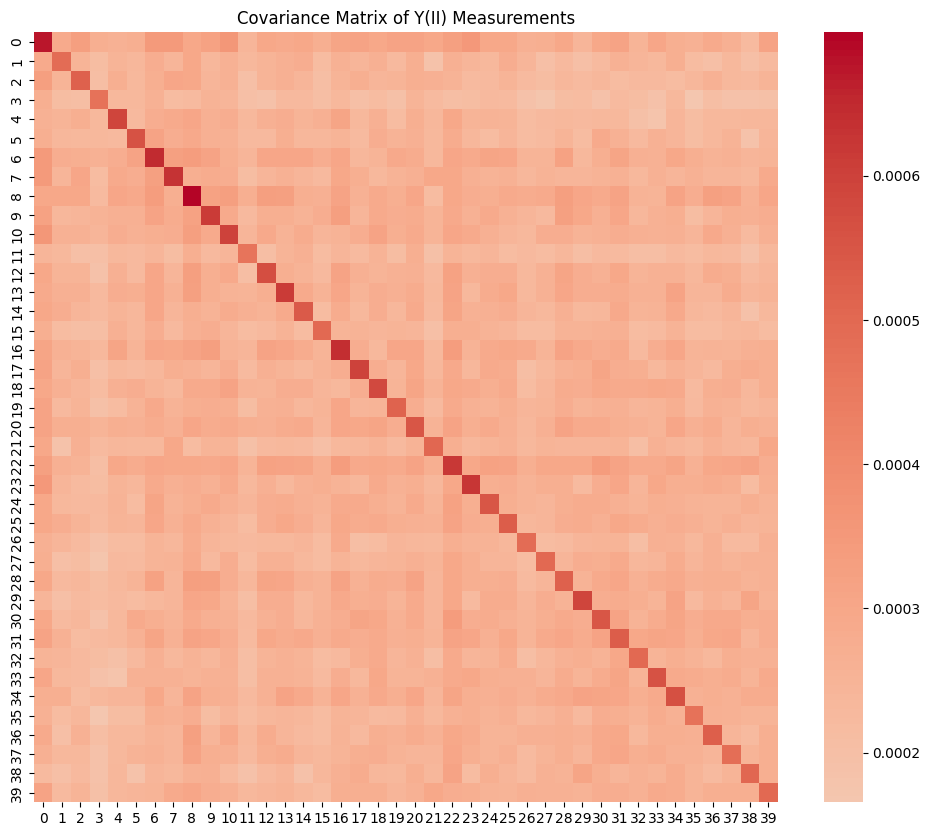

In [45]:
# show the correlation matrix
Model_checks.plot_cov(data_norm_ML_WT_99)

In [48]:
data_norm_WT_99 = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['plate'] == 99)]

In [49]:
data_norm_WT_99_2h = data_norm_WT_99[data_norm_WT_99['light_regime'] == '2h-2h']

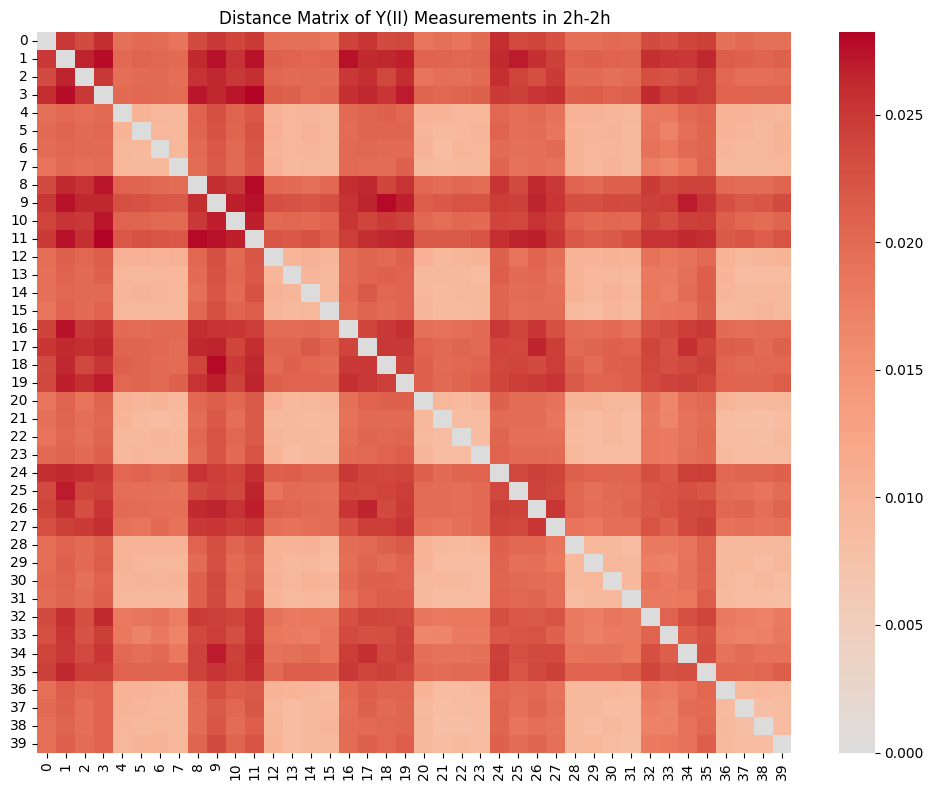

In [50]:
Model_checks.plot_distance_matrix(data_norm_WT_99_2h)

Text(0.5, 1.0, 'Relationship between y2_1 and y2_40')

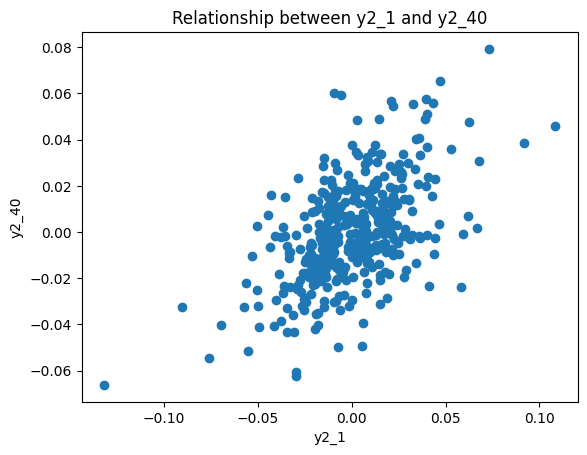

In [51]:
# plot the relationship between y_1 and y_40
plt.scatter(data_norm_ML_WT_99['y2_1'], data_norm_ML_WT_99['y2_40'])
plt.xlabel('y2_1')
plt.ylabel('y2_40')
plt.title('Relationship between y2_1 and y2_40')

(array([ 1.,  1.,  1.,  6., 19., 24., 49., 58., 70., 52., 47., 23., 18.,
        10.,  0.,  1.,  2.,  0.,  0.,  1.]),
 array([-0.05654637, -0.04988838, -0.0432304 , -0.03657242, -0.02991444,
        -0.02325645, -0.01659847, -0.00994049, -0.00328251,  0.00337548,
         0.01003346,  0.01669144,  0.02334942,  0.03000741,  0.03666539,
         0.04332337,  0.04998135,  0.05663934,  0.06329732,  0.0699553 ,
         0.07661328]),
 <BarContainer object of 20 artists>)

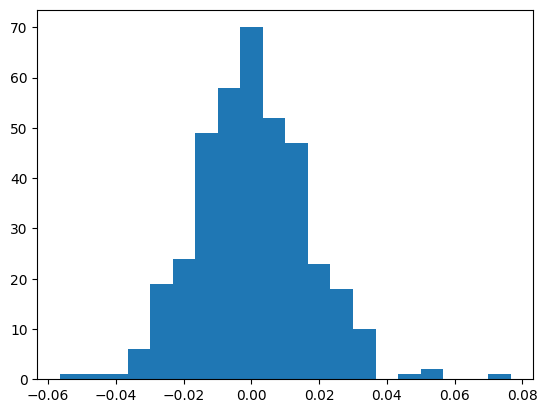

In [52]:
# plot a histogram of mean_y2_norm values for ML
plt.hist(data_norm_ML_WT_99['mean_y2'], bins=20)

In [34]:
data_norm_ML_WT_99 = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['plate'] == 99) & (data_norm['light_regime'] == '2h-2h')]

In [35]:
data_norm_ML_WT_99_y2 = data_norm_ML_WT_99.filter(like='y2_').dropna(axis=1)

In [36]:
# shuffle the columns randomly
data_norm_ML_WT_99_y2_shuffled = data_norm_ML_WT_99_y2.sample(frac=1, axis=1)

Text(0.5, 1.0, 'Lagged Autocorrelation of the y2 values shuffled of the WT in ML light regime for plate 99')

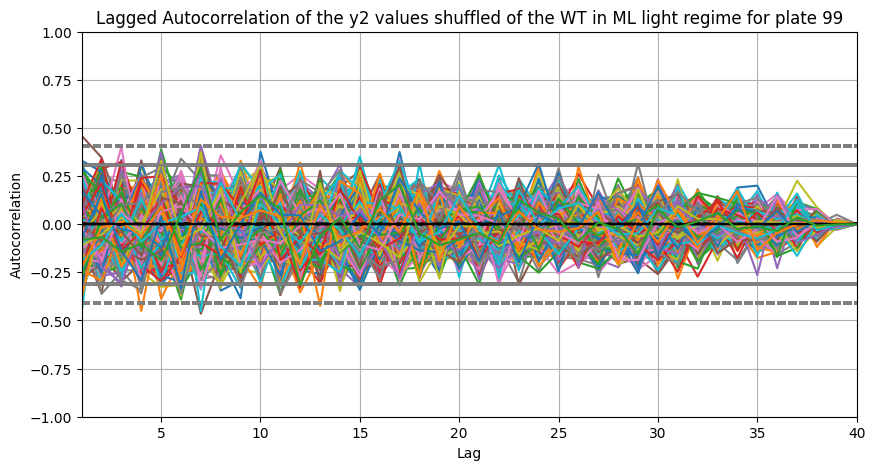

In [37]:
# plot the lagged autocorrelation of the y2 values of the first 10 rows
plt.figure(figsize=(10, 5))
for i in range(len(data_norm_ML_WT_99_y2_shuffled)):
    pd.plotting.autocorrelation_plot(data_norm_ML_WT_99_y2_shuffled.iloc[i])
plt.title('Lagged Autocorrelation of the y2 values shuffled of the WT in ML light regime for plate 99')

Text(0.5, 1.0, 'Lagged Autocorrelation of the y2 values of the WT in ML light regime for plate 99')

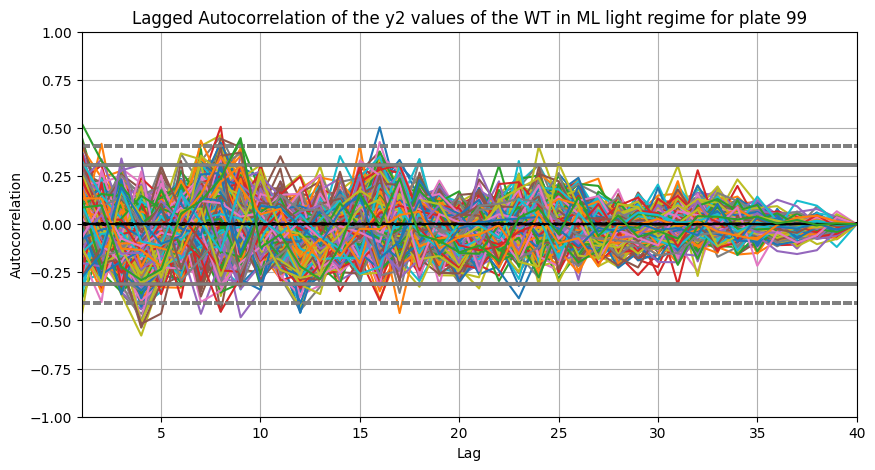

In [38]:
# plot the lagged autocorrelation of the y2 values of the first 10 rows
plt.figure(figsize=(10, 5))
for i in range(len(data_norm_ML_WT_99_y2)):
    pd.plotting.autocorrelation_plot(data_norm_ML_WT_99_y2.iloc[i])
plt.title('Lagged Autocorrelation of the y2 values of the WT in ML light regime for plate 99')

# The gray lines represent the 95% confidence band. The dashed line is the 95% confidence band for the null hypothesis that the data is non-autocorrelated.

Text(0.5, 1.0, 'Average Lagged Autocorrelation of the y2 values of the WT')

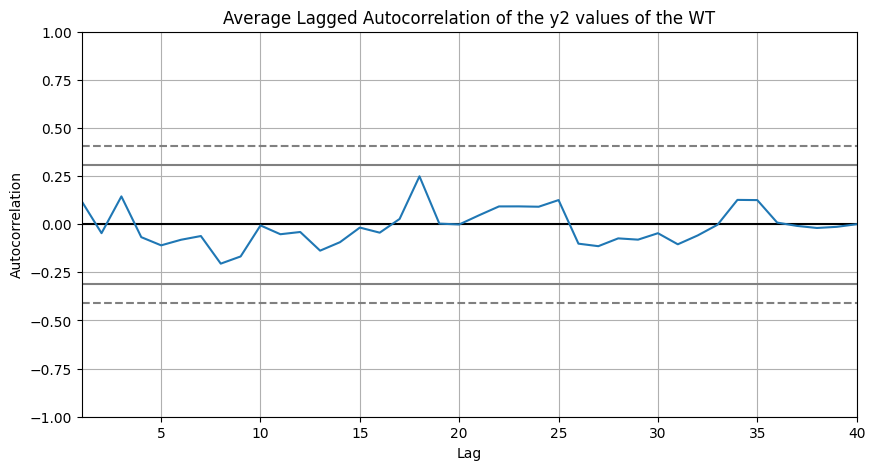

In [39]:
# plot the lagged autocorrelation of the average of y2 values of each row
plt.figure(figsize=(10, 5))
pd.plotting.autocorrelation_plot(data_norm_ML_WT_99_y2.mean())
plt.title('Average Lagged Autocorrelation of the y2 values of the WT')

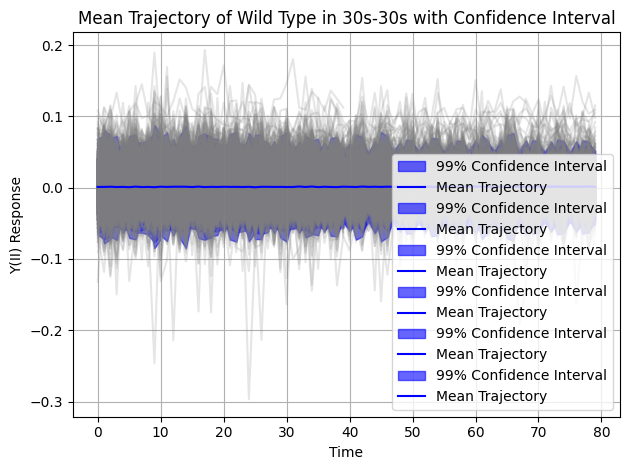

In [99]:
fig, axes = plt.subplots(2, 3, figsize=(10, 5))

for i, light in enumerate(data_norm['light_regime'].unique()):
    data_light = data_norm[data_norm['light_regime'] == light]
    Outlier_detection_v2.mean_cov_y2_WT_v2(data_light, light, plot=True, ax=axes[i])
plt.tight_layout()
plt.show()

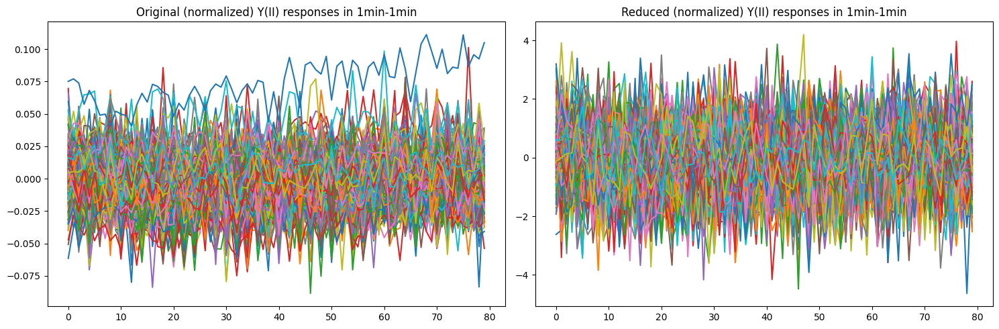

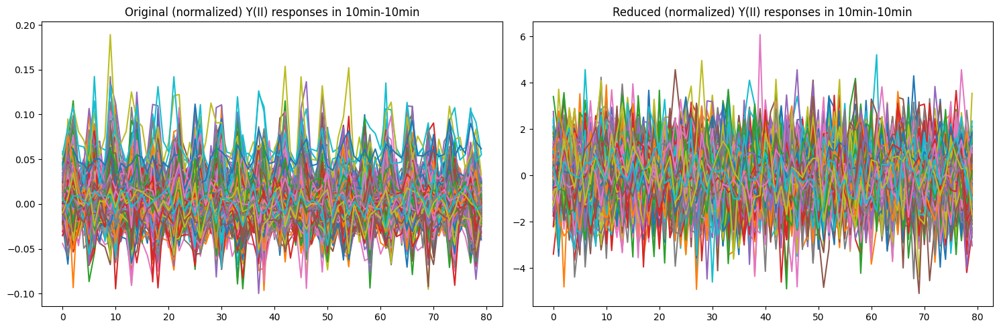

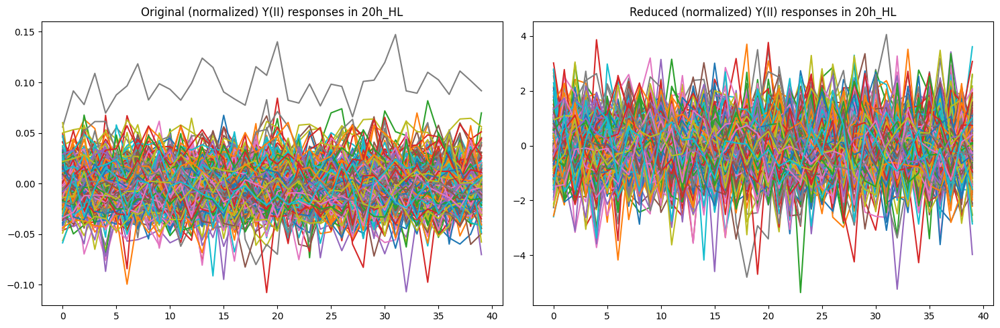

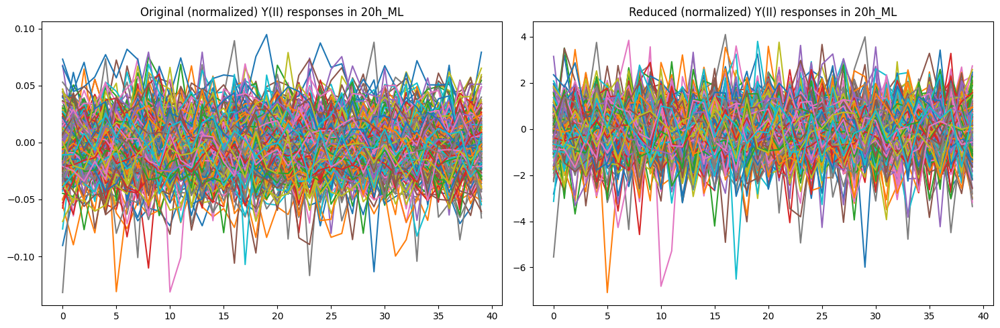

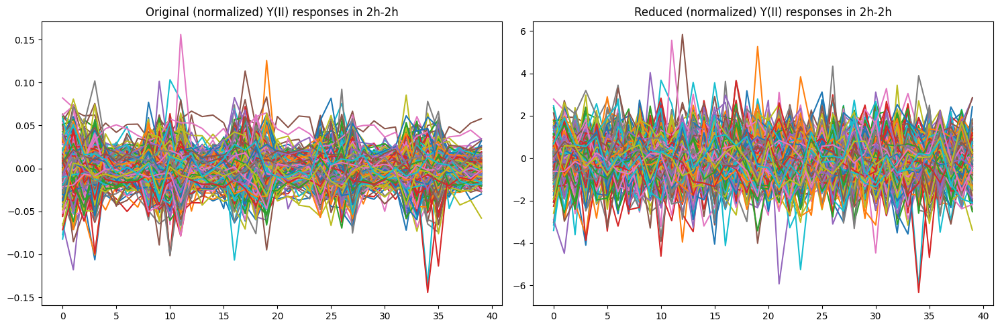

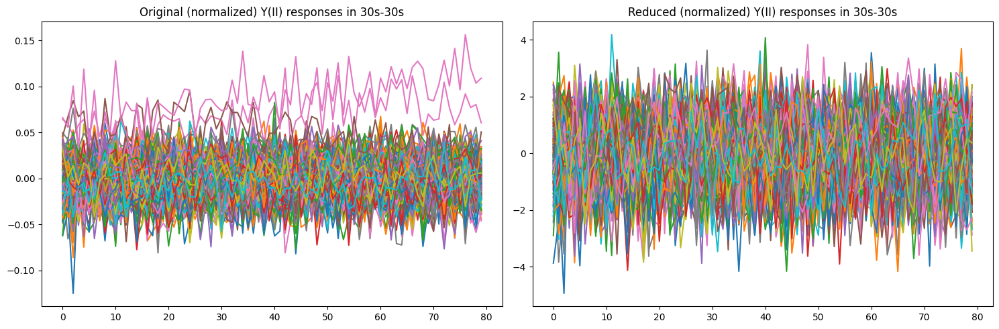

In [53]:
Model_checks.plot_reducted_gaussian_vectors(data_norm_WT)

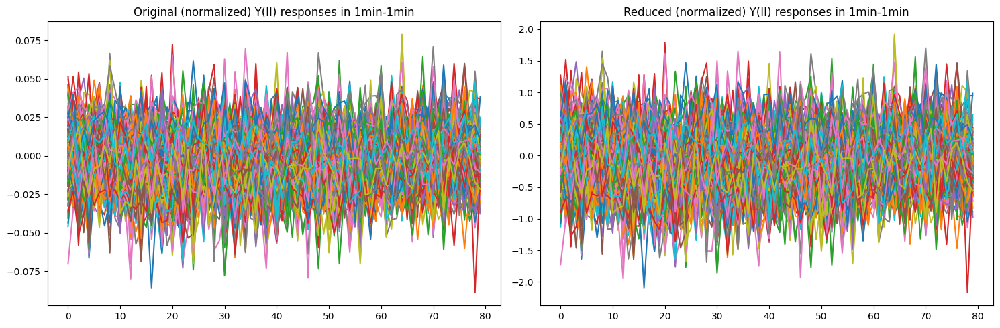

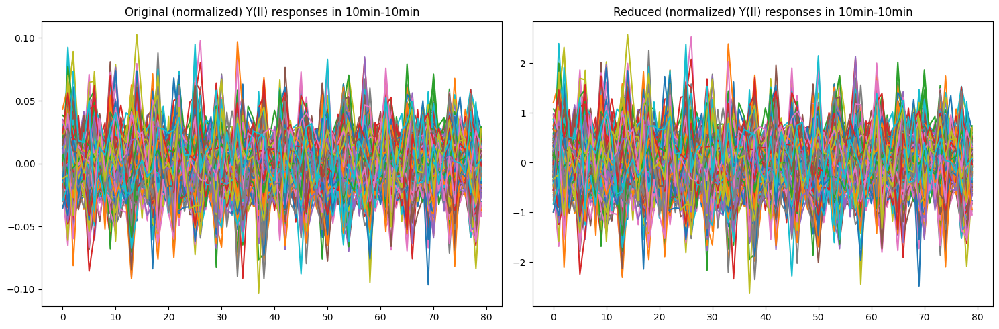

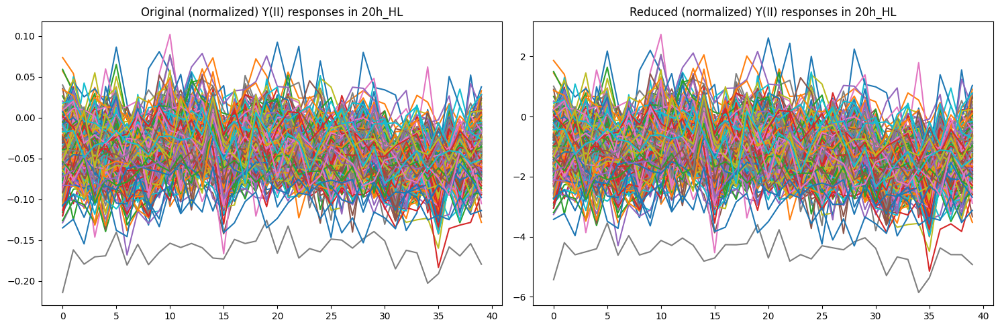

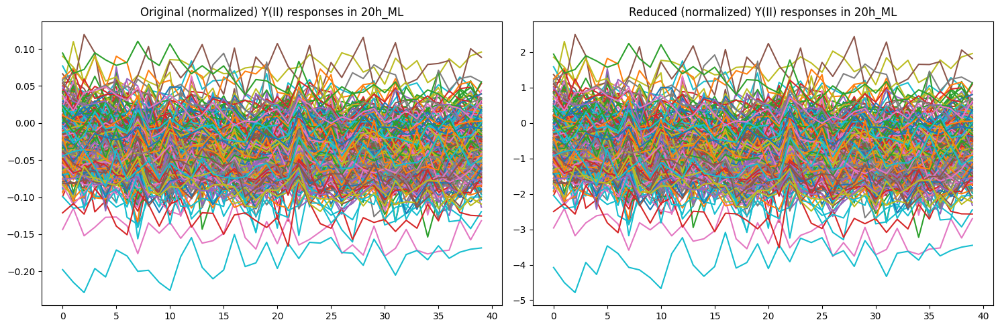

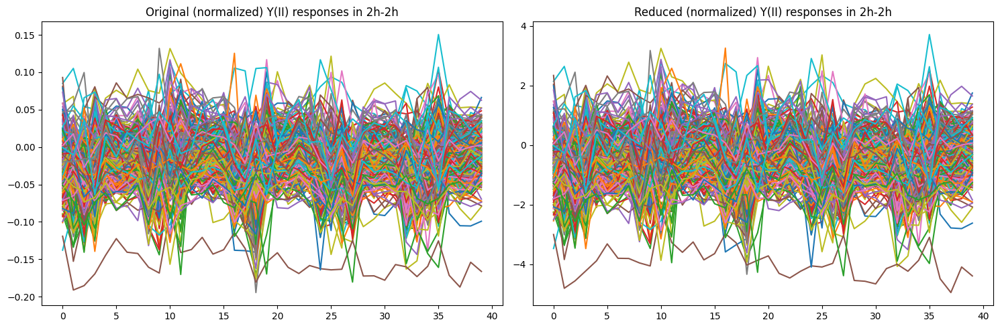

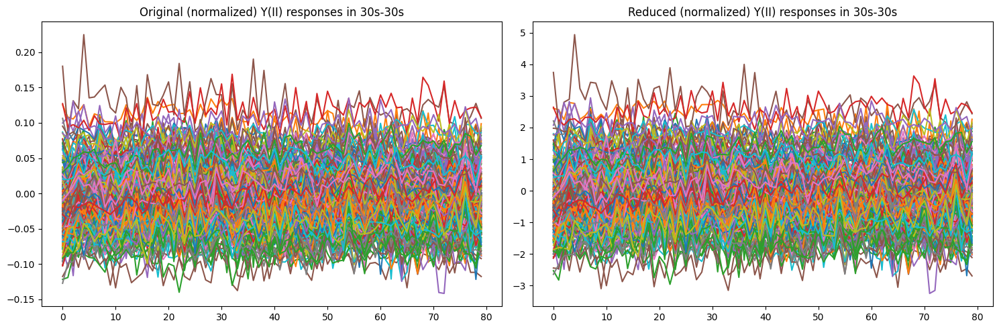

In [41]:
Model_checks.plot_diagonal_reducted_gaussian_vectors(data_norm_ok)

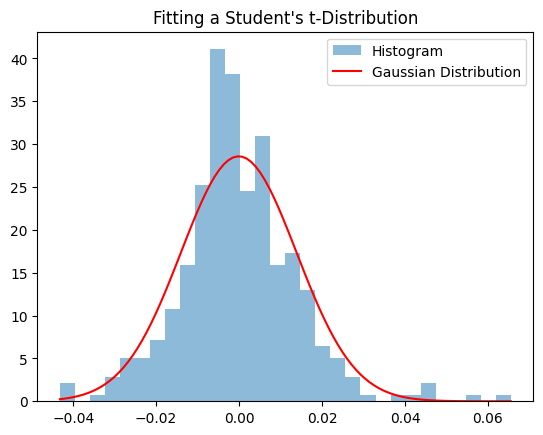

In [169]:
from scipy.stats import t
import matplotlib.pyplot as plt

fv_fm = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['flag_y2'] == 'ok') & (data_norm['light_regime'] == '20h_HL') & (data_norm['plate'] == 99)]['fv_fm'].values

# Fit t-distribution to your data
df, loc, scale = t.fit(fv_fm)
t_dist = t(df=df, loc=loc, scale=scale)

# Plot histogram and overlay t-distribution
plt.hist(fv_fm, bins=30, density=True, alpha=0.5, label='Histogram')
x = np.linspace(min(fv_fm), max(fv_fm), 100)
plt.plot(x, multivariate_normal.pdf(x, mean=fv_fm.mean(), cov=fv_fm.std()**2), 'r-', label='Gaussian Distribution')
# plt.plot(x, t_dist.pdf(x), 'r-', label='t-Distribution')
# plt.title('Fitting a Student\'s t-Distribution')
plt.legend()
plt.show()

In [170]:
# get the argmax of the values
sorted_fv_fm = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['flag_y2'] == 'ok') & (data_norm['light_regime'] == '20h_HL') & (data_norm['plate'] == 99)].sort_values('fv_fm')

In [18]:
# show a hist of data_norm['fv_fm'] with the empirical gaussian associated

ynpqend = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['flag_ynpq'] == 'ok')]['ynpqend'].values.astype(float)
mean_ynpqend = np.mean(ynpqend)
std_ynpqend = np.std(ynpqend)
x = np.linspace(ynpqend.min(), ynpqend.max(), 100)
df, loc, scale = t.fit(ynpqend)
t_dist = t(df=df, loc=loc, scale=scale)
plt.hist(ynpqend, bins=30, density=True, label='Histogram')

# plt.plot(x, multivariate_normal.pdf(x, mean=mean_ynpqend, cov=std_ynpqend**2), label='Gaussian Distribution')
plt.plot(x, t_dist.pdf(x), 'r-', label='t-Distribution')
plt.legend()
plt.show()

NameError: name 't' is not defined

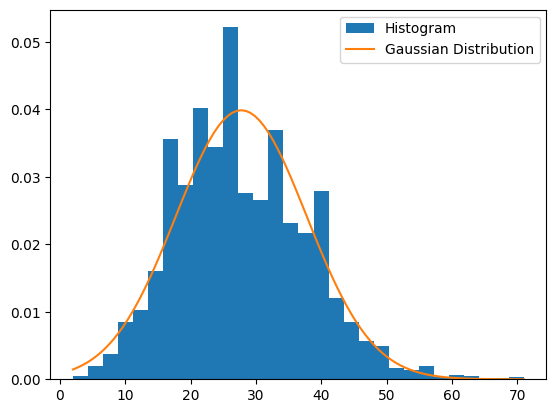

In [31]:
# show a hist of data_norm['fv_fm'] with the empirical gaussian associated

mask_area = data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['flag_ynpq'] == 'ok')]['mask_area'].values.astype(float)
mean_mask_area = np.mean(mask_area)
std_mask_area = np.std(mask_area)
x = np.linspace(mask_area.min(), mask_area.max(), 100)
# df, loc, scale = stats.t.fit(ynpqend)
# t_dist = stats.t(df=df, loc=loc, scale=scale)
plt.hist(mask_area, bins=30, density=True, label='Histogram')

plt.plot(x, multivariate_normal.pdf(x, mean=mean_ynpqend, cov=std_mask_area**2), label='Gaussian Distribution')
# plt.plot(x, t_dist.pdf(x), 'r-', label='t-Distribution')
plt.legend()
plt.show()

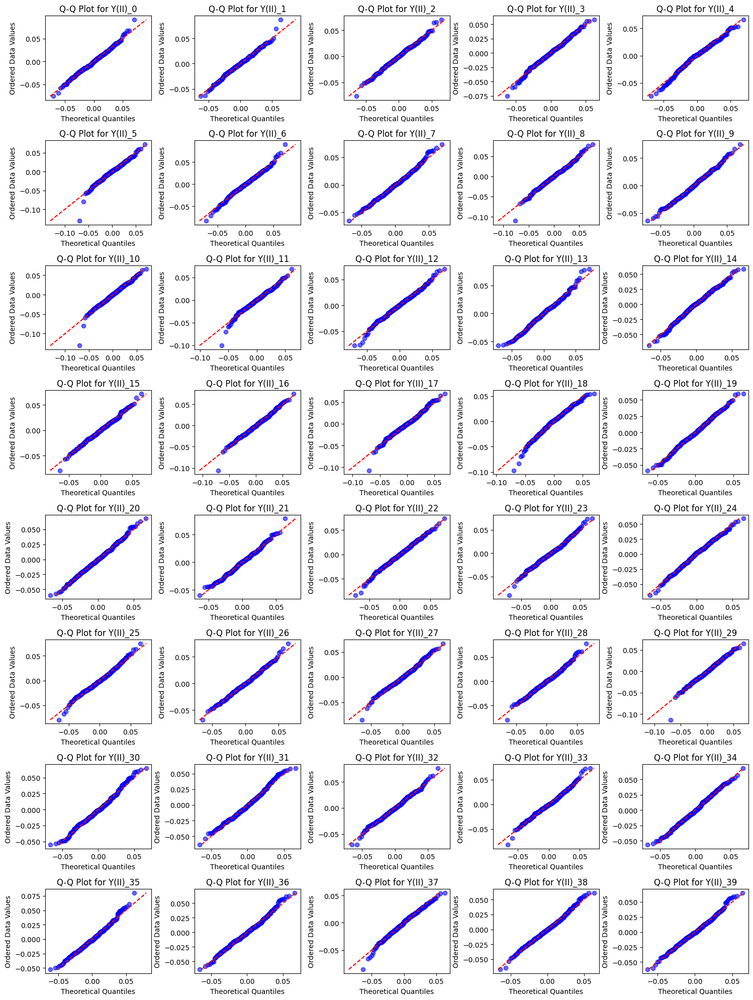

In [94]:
Model_checks.qqplot_time_points(data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['flag_y2'] == 'ok') & (data_norm['light_regime'] == '20h_ML') & (data_norm['plate'] == 99)])

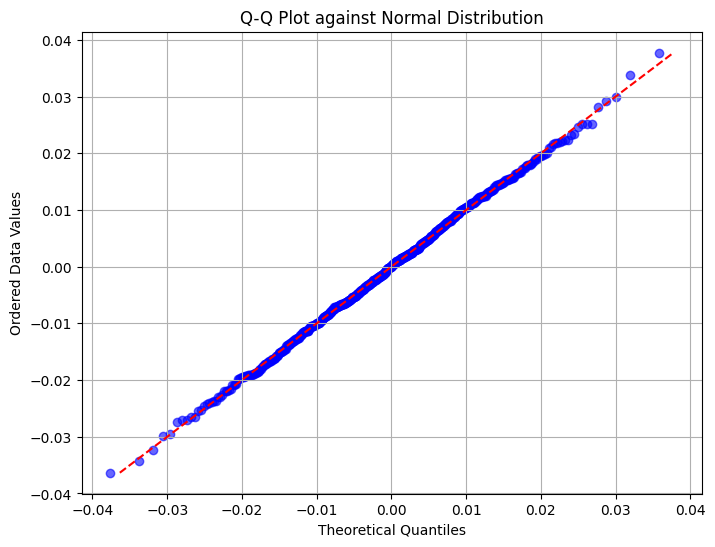

In [168]:
Model_checks.qqplot(data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['flag_y2'] == 'ok') & (data_norm['light_regime'] == '10min-10min') & (data_norm['plate'] == 99)]['fv_fm'].values, law='norm')

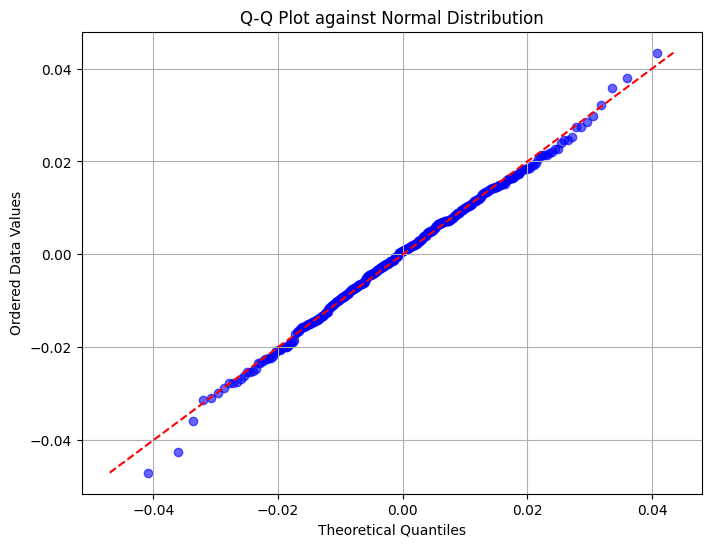

In [198]:
Model_checks.qqplot(data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['flag_ynpq'] == 'ok') & (data_norm['plate'] == 99) & (data_norm['light_regime'] == '20h_HL')]['ynpqend'].values.astype(float), law='norm')

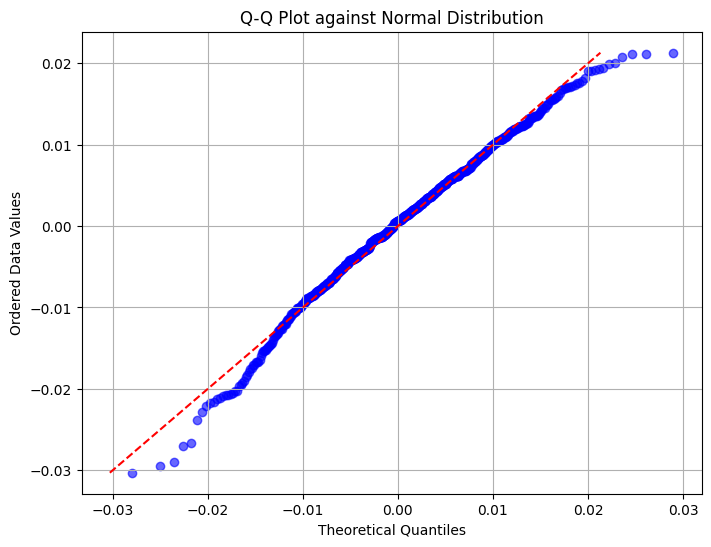

In [184]:
Model_checks.qqplot(data_norm[(data_norm['mutant_ID'] == 'WT') & (data_norm['flag_ynpq'] == 'ok') & (data_norm['light_regime'] == '1min-1min') & (data_norm['plate'] == 99)]['ynpqend'].values, law='norm')

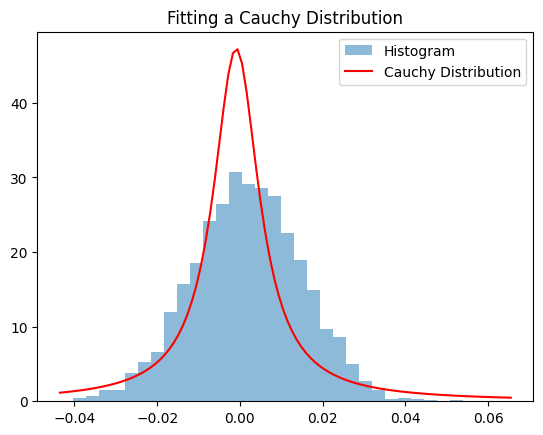

In [33]:
from scipy.stats import cauchy

# Fit Cauchy distribution to your data
loc, scale = cauchy.fit(fv_fm)
cauchy_dist = cauchy(loc=loc, scale=scale)

# Plot histogram and overlay Cauchy distribution
plt.hist(data, bins=30, density=True, alpha=0.5, label='Histogram')
x = np.linspace(min(fv_fm), max(fv_fm), 100)
plt.plot(x, cauchy_dist.pdf(x), 'r-', label='Cauchy Distribution')
plt.title('Fitting a Cauchy Distribution')
plt.legend()
plt.show()